In [100]:
import warnings
for warn in [UserWarning, FutureWarning]: warnings.filterwarnings("ignore", category = warn)

# Импорт необходимых библиотек
import os
import io
import socket
import random
import torch
import torch.nn as nn
import torch.optim as optim
import tensorboard as tb
import numpy as np
import pandas as pd
import polars as pl
import tabulate
import datasets
import torchvision as tv
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
import torch.nn.functional as F
import PIL
import ipywidgets
import time
import matplotlib as mpl
import matplotlib.pyplot as plt
import tqdm
import logging
from datasets import Dataset, Features, ClassLabel, Value

from dataclasses import dataclass
from typing import ClassVar

from pathlib import Path
from torch.optim import Adam
from torchvision.transforms import v2
from torchvision import transforms as T
from torch.nn.utils.rnn import pad_sequence
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import TensorDataset, DataLoader
from datasets import load_dataset_builder, load_dataset, get_dataset_split_names, get_dataset_config_names, Dataset, Image, DatasetInfo
from datetime import datetime
from PIL import Image as PILImage, ImageFont, ImageDraw
from collections import Counter

from typing import List, Dict, Any, Tuple, Optional

In [101]:
from datasets import load_dataset

ds = load_dataset("nroggendorff/flowers")
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 593
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 66
    })
})

In [102]:
print(ds["train"].features)


{'image': Image(mode=None, decode=True), 'label': Value('string')}


In [103]:
labels = ds["train"]["label"]
class_names = sorted(list(set(labels)))
print("Class names:", class_names)
print("Num classes:", len(class_names))


Class names: ['bougainvillea', 'daisy', 'garden', 'gardenia', 'hibiscus', 'hydrangea', 'lily', 'orchid', 'peony', 'tulip']
Num classes: 10


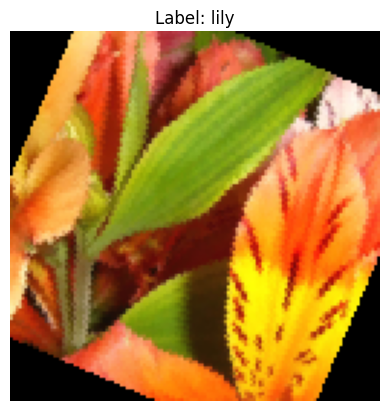

In [104]:
compose = v2.Compose([
    v2.RandomResizedCrop(size=(128, 128), antialias=True),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomRotation(25),
    v2.ToTensor(),
])

def transforms(batch):
    batch["pixel_values"] = [compose(img) for img in batch["image"]]
    return batch

ds["train"].set_transform(transforms)

sample = ds["train"][0]
img_tensor = sample["pixel_values"]
img_np = img_tensor.permute(1, 2, 0).numpy()

plt.imshow(img_np)
plt.title(f"Label: {sample['label']}")
plt.axis("off")
plt.show()


In [105]:
class CNN128(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 128 -> 64

            nn.Conv2d(32, 64, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 64 -> 32

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 32 -> 16
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128*16*16, 512),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.2),

            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


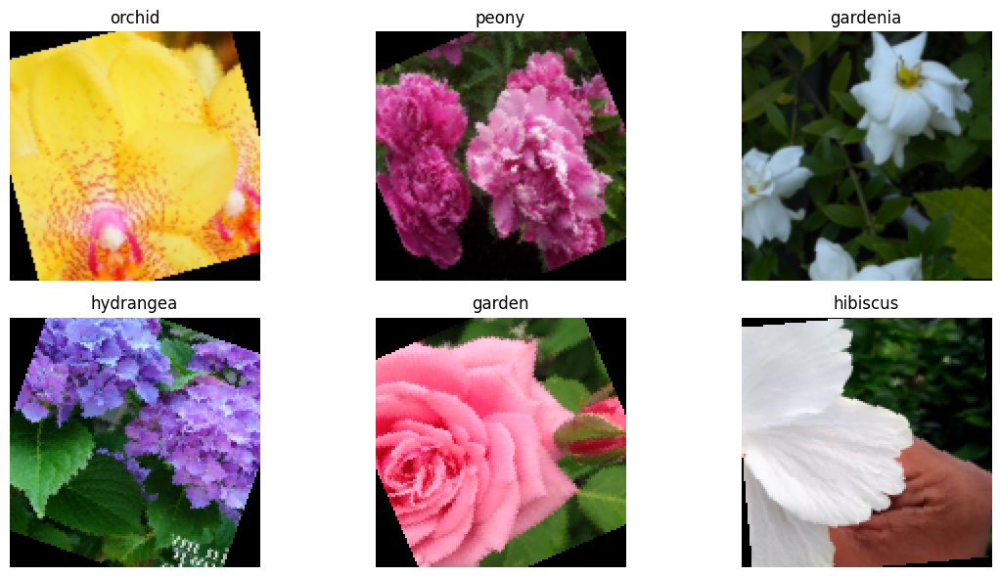

Shape of first transformed tensor: torch.Size([3, 128, 128])


In [106]:
def show_random_transformed_images(dataset, num_samples=6):
    indices = random.sample(range(len(dataset)), num_samples)
    plt.figure(figsize=(12, 6))
    tensors = []

    for i, idx in enumerate(indices):
        example = dataset[idx]
        img = example["image"]
        label = example["label"]

        img_tensor = compose(img)
        tensors.append(img_tensor)


        plt.subplot(2, 3, i + 1)
        plt.imshow(img_tensor.permute(1, 2, 0))
        plt.title(label)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

    return tensors

transformed_tensors = show_random_transformed_images(ds["train"], num_samples=6)
print("Shape of first transformed tensor:", transformed_tensors[0].shape)


In [111]:
BATCH_SIZE = 64
EPOCHS = 32
LEARNING_RATE = 1e-4
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = CNN128(num_classes=len(class_names)).to(DEVICE)
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

log_dir = os.path.join("runs", f"CNN128_flowers_{datetime.now().strftime('%b%d_%H-%M-%S')}")
writer = SummaryWriter(log_dir)

os.makedirs("models", exist_ok=True)
best_test_acc = 0.0

In [112]:
class_names = sorted(ds["train"].unique("label"))
class_to_idx = {name: idx for idx, name in enumerate(class_names)}

print("Class names:", class_names)
print("Class to idx:", class_to_idx)


Class names: ['bougainvillea', 'daisy', 'garden', 'gardenia', 'hibiscus', 'hydrangea', 'lily', 'orchid', 'peony', 'tulip']
Class to idx: {'bougainvillea': 0, 'daisy': 1, 'garden': 2, 'gardenia': 3, 'hibiscus': 4, 'hydrangea': 5, 'lily': 6, 'orchid': 7, 'peony': 8, 'tulip': 9}


In [113]:
def collate_fn(batch):
    images = torch.stack([compose(example["image"]) for example in batch])
    labels = torch.tensor([class_to_idx[example["label"]] for example in batch], dtype=torch.long)
    return images, labels


train_loader = DataLoader(ds["train"], batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)
test_loader = DataLoader(ds["test"], batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)


In [114]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter(log_dir="runs/experiment1")


In [115]:
from tqdm import tqdm

for epoch in range(1, EPOCHS + 1):
    model.train()
    total_loss, total_correct = 0.0, 0
    with tqdm(total=len(train_loader), desc=f"Epoch {epoch}/{EPOCHS} - Train", unit="batch") as pbar_train:
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_fn(outputs, targets)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_correct += (outputs.argmax(1) == targets).sum().item()

            pbar_train.set_postfix({"Loss": f"{total_loss/(pbar_train.n+1):.4f}",
                                    "Acc": f"{total_correct/((pbar_train.n+1)*BATCH_SIZE):.4f}"})
            pbar_train.update(1)

    avg_train_loss = total_loss / len(train_loader)
    train_acc = total_correct / len(ds["train"])
    writer.add_scalar("Loss/train", avg_train_loss, epoch)
    writer.add_scalar("Accuracy/train", train_acc, epoch)

    model.eval()
    total_loss_test, total_correct_test = 0.0, 0
    with torch.no_grad():
        with tqdm(total=len(test_loader), desc=f"Epoch {epoch}/{EPOCHS} - Test", unit="batch") as pbar_test:
            for imgs, targets in test_loader:
                imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
                outputs = model(imgs)
                loss = loss_fn(outputs, targets)

                total_loss_test += loss.item()
                total_correct_test += (outputs.argmax(1) == targets).sum().item()

                pbar_test.set_postfix({"Loss": f"{total_loss_test/(pbar_test.n+1):.4f}",
                                       "Acc": f"{total_correct_test/((pbar_test.n+1)*BATCH_SIZE):.4f}"})
                pbar_test.update(1)

    avg_test_loss = total_loss_test / len(test_loader)
    test_acc = total_correct_test / len(ds["test"])
    writer.add_scalar("Loss/test", avg_test_loss, epoch)
    writer.add_scalar("Accuracy/test", test_acc, epoch)

    print(f"Epoch {epoch}/{EPOCHS} | "
          f"Train Loss={avg_train_loss:.4f}, Train Acc={train_acc:.4f} | "
          f"Test Loss={avg_test_loss:.4f}, Test Acc={test_acc:.4f}")

    save_dir = "models"
    os.makedirs(save_dir, exist_ok=True)
    if test_acc > best_test_acc:
        best_test_acc = test_acc
        torch.save(model.state_dict(), f"models/CNN128_best.pth")
        print(f"Лучшая модель сохранена с Test Acc={best_test_acc:.4f}")

writer.close()


Epoch 1/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.50s/batch, Loss=2.3086, Acc=0.0391]


Epoch 1/32 | Train Loss=2.3014, Train Acc=0.1079 | Test Loss=2.3086, Test Acc=0.0758
Лучшая модель сохранена с Test Acc=0.0758


Epoch 2/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.68s/batch, Loss=2.2611, Acc=0.0703]


Epoch 2/32 | Train Loss=2.2873, Train Acc=0.1366 | Test Loss=2.2611, Test Acc=0.1364
Лучшая модель сохранена с Test Acc=0.1364


Epoch 3/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.93s/batch, Loss=2.2365, Acc=0.0703]


Epoch 3/32 | Train Loss=2.2513, Train Acc=0.2057 | Test Loss=2.2365, Test Acc=0.1364


Epoch 4/32 - Test: 100%|██████████| 2/2 [00:04<00:00,  2.14s/batch, Loss=2.0064, Acc=0.0938]


Epoch 4/32 | Train Loss=2.1925, Train Acc=0.2024 | Test Loss=2.0064, Test Acc=0.1818
Лучшая модель сохранена с Test Acc=0.1818


Epoch 5/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.94s/batch, Loss=1.9172, Acc=0.0859]


Epoch 5/32 | Train Loss=2.0683, Train Acc=0.2361 | Test Loss=1.9172, Test Acc=0.1667


Epoch 6/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.81s/batch, Loss=1.8413, Acc=0.1094]


Epoch 6/32 | Train Loss=2.0198, Train Acc=0.2580 | Test Loss=1.8413, Test Acc=0.2121
Лучшая модель сохранена с Test Acc=0.2121


Epoch 7/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.59s/batch, Loss=1.8739, Acc=0.1719]


Epoch 7/32 | Train Loss=1.8818, Train Acc=0.3221 | Test Loss=1.8739, Test Acc=0.3333
Лучшая модель сохранена с Test Acc=0.3333


Epoch 8/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.51s/batch, Loss=1.7481, Acc=0.1250]


Epoch 8/32 | Train Loss=1.8733, Train Acc=0.3137 | Test Loss=1.7481, Test Acc=0.2424


Epoch 9/32 - Test: 100%|██████████| 2/2 [00:02<00:00,  1.47s/batch, Loss=1.7567, Acc=0.1641]


Epoch 9/32 | Train Loss=1.8510, Train Acc=0.2901 | Test Loss=1.7567, Test Acc=0.3182


Epoch 10/32 - Test: 100%|██████████| 2/2 [00:02<00:00,  1.49s/batch, Loss=1.6627, Acc=0.1328]


Epoch 10/32 | Train Loss=1.8004, Train Acc=0.3390 | Test Loss=1.6627, Test Acc=0.2576


Epoch 11/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.69s/batch, Loss=1.7969, Acc=0.1562]


Epoch 11/32 | Train Loss=1.8107, Train Acc=0.3187 | Test Loss=1.7969, Test Acc=0.3030


Epoch 12/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.55s/batch, Loss=1.7887, Acc=0.1406]


Epoch 12/32 | Train Loss=1.8100, Train Acc=0.3373 | Test Loss=1.7887, Test Acc=0.2727


Epoch 13/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.71s/batch, Loss=1.7210, Acc=0.1719]


Epoch 13/32 | Train Loss=1.7922, Train Acc=0.3288 | Test Loss=1.7210, Test Acc=0.3333


Epoch 14/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.95s/batch, Loss=1.5111, Acc=0.1953]


Epoch 14/32 | Train Loss=1.7455, Train Acc=0.3794 | Test Loss=1.5111, Test Acc=0.3788
Лучшая модель сохранена с Test Acc=0.3788


Epoch 15/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.97s/batch, Loss=1.6499, Acc=0.1875]


Epoch 15/32 | Train Loss=1.7255, Train Acc=0.3727 | Test Loss=1.6499, Test Acc=0.3636


Epoch 16/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.84s/batch, Loss=1.5016, Acc=0.2031]


Epoch 16/32 | Train Loss=1.7502, Train Acc=0.3541 | Test Loss=1.5016, Test Acc=0.3939
Лучшая модель сохранена с Test Acc=0.3939


Epoch 17/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.62s/batch, Loss=1.7264, Acc=0.1719]


Epoch 17/32 | Train Loss=1.6948, Train Acc=0.3592 | Test Loss=1.7264, Test Acc=0.3333


Epoch 18/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.50s/batch, Loss=1.6768, Acc=0.1641]


Epoch 18/32 | Train Loss=1.6858, Train Acc=0.3963 | Test Loss=1.6768, Test Acc=0.3182


Epoch 19/32 - Test: 100%|██████████| 2/2 [00:02<00:00,  1.46s/batch, Loss=1.6373, Acc=0.2109]


Epoch 19/32 | Train Loss=1.7347, Train Acc=0.3845 | Test Loss=1.6373, Test Acc=0.4091
Лучшая модель сохранена с Test Acc=0.4091


Epoch 20/32 - Test: 100%|██████████| 2/2 [00:02<00:00,  1.46s/batch, Loss=1.5779, Acc=0.2109]


Epoch 20/32 | Train Loss=1.6660, Train Acc=0.3946 | Test Loss=1.5779, Test Acc=0.4091


Epoch 21/32 - Test: 100%|██████████| 2/2 [00:02<00:00,  1.48s/batch, Loss=1.7013, Acc=0.1641]


Epoch 21/32 | Train Loss=1.6662, Train Acc=0.4047 | Test Loss=1.7013, Test Acc=0.3182


Epoch 22/32 - Test: 100%|██████████| 2/2 [00:02<00:00,  1.45s/batch, Loss=1.5501, Acc=0.1797]


Epoch 22/32 | Train Loss=1.6196, Train Acc=0.4115 | Test Loss=1.5501, Test Acc=0.3485


Epoch 23/32 - Test: 100%|██████████| 2/2 [00:02<00:00,  1.46s/batch, Loss=1.5281, Acc=0.2109]


Epoch 23/32 | Train Loss=1.6625, Train Acc=0.4148 | Test Loss=1.5281, Test Acc=0.4091


Epoch 24/32 - Test: 100%|██████████| 2/2 [00:02<00:00,  1.46s/batch, Loss=1.5089, Acc=0.1953]


Epoch 24/32 | Train Loss=1.5893, Train Acc=0.4334 | Test Loss=1.5089, Test Acc=0.3788


Epoch 25/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.53s/batch, Loss=1.8847, Acc=0.1641]


Epoch 25/32 | Train Loss=1.5995, Train Acc=0.3980 | Test Loss=1.8847, Test Acc=0.3182


Epoch 26/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.82s/batch, Loss=1.5456, Acc=0.1797]


Epoch 26/32 | Train Loss=1.5913, Train Acc=0.4384 | Test Loss=1.5456, Test Acc=0.3485


Epoch 27/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.97s/batch, Loss=1.7027, Acc=0.2188]


Epoch 27/32 | Train Loss=1.5688, Train Acc=0.4536 | Test Loss=1.7027, Test Acc=0.4242
Лучшая модель сохранена с Test Acc=0.4242


Epoch 28/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.73s/batch, Loss=1.5546, Acc=0.1953]


Epoch 28/32 | Train Loss=1.5707, Train Acc=0.4401 | Test Loss=1.5546, Test Acc=0.3788


Epoch 29/32 - Test: 100%|██████████| 2/2 [00:03<00:00,  1.54s/batch, Loss=1.5401, Acc=0.2188]


Epoch 29/32 | Train Loss=1.5240, Train Acc=0.4553 | Test Loss=1.5401, Test Acc=0.4242


Epoch 30/32 - Test: 100%|██████████| 2/2 [00:02<00:00,  1.46s/batch, Loss=1.4925, Acc=0.2266]


Epoch 30/32 | Train Loss=1.5221, Train Acc=0.4654 | Test Loss=1.4925, Test Acc=0.4394
Лучшая модель сохранена с Test Acc=0.4394


Epoch 31/32 - Test: 100%|██████████| 2/2 [00:02<00:00,  1.46s/batch, Loss=1.4510, Acc=0.1953]


Epoch 31/32 | Train Loss=1.5323, Train Acc=0.4452 | Test Loss=1.4510, Test Acc=0.3788


Epoch 32/32 - Test: 100%|██████████| 2/2 [00:02<00:00,  1.45s/batch, Loss=1.4843, Acc=0.1797]

Epoch 32/32 | Train Loss=1.5126, Train Acc=0.4503 | Test Loss=1.4843, Test Acc=0.3485


In [116]:
%load_ext tensorboard
%tensorboard --logdir runs/experiment1


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 27363), started 0:46:38 ago. (Use '!kill 27363' to kill it.)

<IPython.core.display.Javascript object>

5 этап.

In [125]:
def get_predictions(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for imgs, labels in dataloader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_preds), np.array(all_labels)

train_preds, train_labels = get_predictions(model, train_loader, DEVICE)
test_preds, test_labels = get_predictions(model, test_loader, DEVICE)


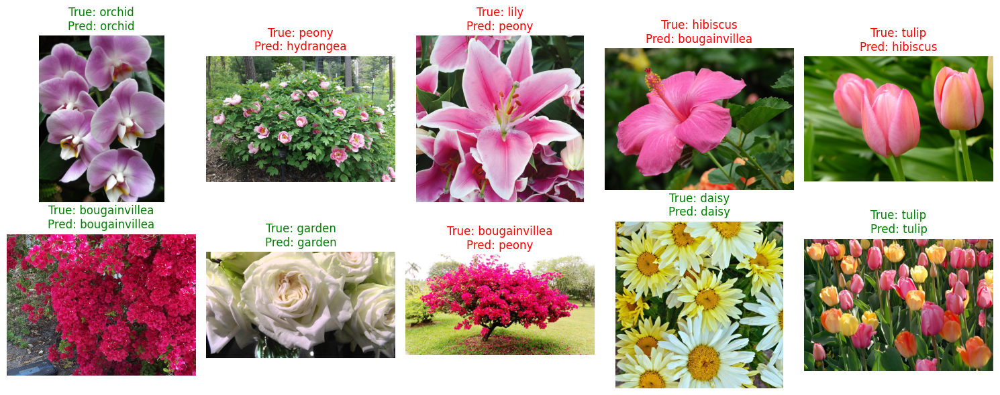

In [118]:
def visualize_predictions(dataset, preds, labels, class_names, num_images=10):
    plt.figure(figsize=(15, 6))
    idxs = np.random.choice(len(preds), size=num_images, replace=False)

    for i, idx in enumerate(idxs):
        idx = int(idx)
        img = dataset[idx]["image"]
        true_label = class_names[labels[idx]]
        pred_label = class_names[preds[idx]]
        color = "green" if labels[idx] == preds[idx] else "red"

        plt.subplot(2, 5, i + 1)
        plt.imshow(img)
        plt.title(f"True: {true_label}\nPred: {pred_label}", color=color)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

visualize_predictions(ds["test"], test_preds, test_labels, class_names, num_images=10)


модель была сохранена ранее, сразу переходим к 7 пункту.

In [120]:
num_classes = 10

In [121]:
model = CNN128(num_classes=num_classes)
model.load_state_dict(torch.load("models/CNN128_best.pth", map_location=DEVICE))
model.to(DEVICE)
model.eval()

def predict_with_probs(model, dataloader, device):
    model.eval()
    all_preds = []
    all_probs = []
    all_labels = []

    with torch.no_grad():
        for imgs, labels in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs)
            probs = F.softmax(outputs, dim=1)
            preds = outputs.argmax(dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.numpy())

    return np.array(all_preds), np.array(all_probs), np.array(all_labels)


test_preds, test_probs, test_labels = predict_with_probs(model, test_loader, DEVICE)


добавили вероятностей


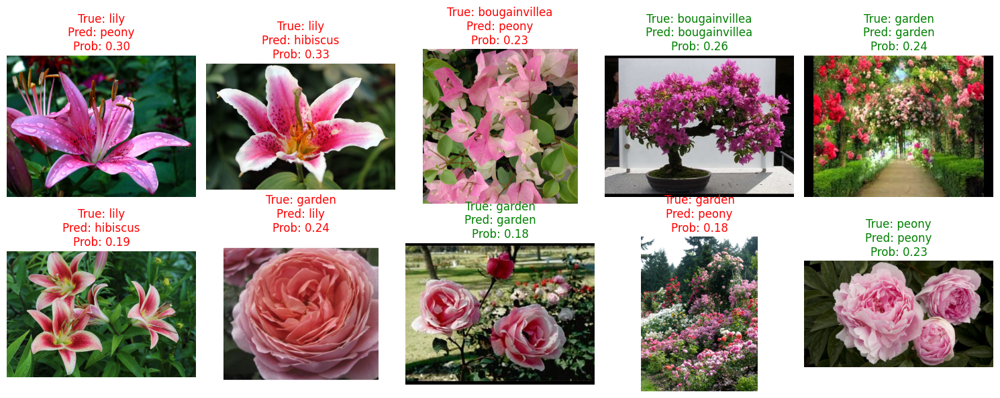

In [123]:
def visualize_predictions_with_probs(dataset, preds, probs, labels, class_names, num_images=10):
    plt.figure(figsize=(15, 6))
    idxs = np.random.choice(len(preds), size=num_images, replace=False)

    for i, idx in enumerate(idxs):
        idx = int(idx)
        img = dataset[idx]["image"]
        true_label = class_names[labels[idx]]
        pred_label = class_names[preds[idx]]
        prob = probs[idx][preds[idx]]
        color = "green" if labels[idx] == preds[idx] else "red"

        plt.subplot(2, 5, i + 1)
        plt.imshow(img)
        plt.title(f"True: {true_label}\nPred: {pred_label}\nProb: {prob:.2f}", color=color)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

visualize_predictions_with_probs(ds["test"], test_preds, test_probs, test_labels, class_names, num_images=10)


Очень хороших значений мы не получили, думаю, проблема в том, что или недостаточная сложность модели, или архитектура слишком простая.

Метрики.


Train Loss: уменьшился с ~2.3 до ~1.51

Test Loss: уменьшился с ~2.3 до ~1.48

Train Accuracy: вырос с ~10% до ~45%

Test Accuracy: максимум ~44%, в конце ~34–35%

Модель не переобучилась сильно.

Улучшений можно придумать много - например, добавить слои,улучшить подбор гиперпараметров, сбалансировать классы.



In [128]:
!zip -r models.zip models
!zip -r runs.zip runs

  adding: models/ (stored 0%)
  adding: models/CNN128_best.pth (deflated 8%)
  adding: runs/ (stored 0%)
  adding: runs/CNN128_flowers_Nov27_13-49-38/ (stored 0%)
  adding: runs/CNN128_flowers_Nov27_13-49-38/events.out.tfevents.1764251378.6735967ffe98.255.3 (deflated 18%)
  adding: runs/experiment1/ (stored 0%)
  adding: runs/experiment1/events.out.tfevents.1764256310.6735967ffe98.255.10 (deflated 65%)
  adding: runs/experiment1/events.out.tfevents.1764255022.6735967ffe98.255.6 (deflated 40%)
  adding: runs/experiment1/events.out.tfevents.1764256294.6735967ffe98.255.8 (deflated 9%)
  adding: runs/CNN128_flowers_Nov27_14-47-29/ (stored 0%)
  adding: runs/CNN128_flowers_Nov27_14-47-29/events.out.tfevents.1764254849.6735967ffe98.255.5 (deflated 40%)
  adding: runs/CNN128_flowers_Nov27_15-11-28/ (stored 0%)
  adding: runs/CNN128_flowers_Nov27_15-11-28/events.out.tfevents.1764256288.6735967ffe98.255.7 (deflated 9%)
  adding: runs/CNN128_flowers_Nov27_13-23-13/ (stored 0%)
  adding: runs/CNN

In [129]:
from google.colab import files

files.download("models.zip")
files.download("runs.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>